# Terzigno / Vesuvius National Park Wildfire — Burn Severity Mapping & Decision Intelligence

**Author:** Alireza Hamoudzadeh
**Domain:** Fire — burn severity / burned-area mapping
**Event:** Wildfire in the Vesuvius National Park (Terzigno pine forest, Mount Somma slope), Campania, Italy

| Field | Value |
|---|---|
| Country | IT |
| Province | Napoli |
| Commune | Terzigno |
| Reported area | 681 ha |
| Ignition (IREDATE) | 2025-08-07 11:36 |
| Last update | 2025-08-18 12:58 |

The fire broke out on the night of 7–8 August 2025 on the Mount Somma flank of Vesuvius National Park, forced the closure of the park's ~600,000-visitor trail network, and — per Italian civil protection and press reporting — damaged vineyards, orchards, and protected pine forest; the cause is under investigation by local prosecutors. This notebook treats it as a real burn-severity mapping and post-fire prioritization case.


## 1. Approach, backend choice, and assumptions

**Backend: Copernicus Data Space Ecosystem (CDSE), via its STAC API.**

I chose CDSE/STAC over Google Earth Engine deliberately. My own operational background (GEE-based hydrological monitoring, ASI GRAW project) is GEE-heavy, so for this assignment I wanted to exercise the STAC-based stack (`pystac-client` + `odc-stac`/`rioxarray`) instead — closer to how EO tooling is typically composed outside a single vendor's server-side environment, and a better test of general EO-engineering ability than replaying a workflow I already know well.

**Collection:** `sentinel-2-l2a` (Surface Reflectance, Scene Classification Layer included) — appropriate here because (a) burn-severity indices (NBR, BAI) are defined on optical bands Sentinel-2 provides at native 10–20 m resolution, (b) the AOI is small (~7 km²) so a single Sentinel-2 tile comfortably covers it, and (c) the SCL band gives us a principled, per-pixel cloud/shadow mask rather than relying on scene-level metadata alone.

**AOI.** I do not have the exact fire perimeter polygon, only the tabular record above (commune, area, dates). I therefore define an approximate bounding box over the Terzigno pine forest / Mount Somma slope of Vesuvius National Park, sized generously beyond the reported 681 ha so that the notebook's outputs include unburned context — needed both for the true-colour composite to be legible and for the decision layer's severity thresholding to have a "normal vegetation" baseline within the same scene. **This is a stated assumption, not a ground-truthed perimeter** — a real deployment would ingest the official Copernicus Emergency Management Service (CEMS) or regional civil-protection perimeter if/when available.

**Dates.**
- Fire window (from the record): 2025-08-07 → 2025-08-18.
- Pre-fire search window: 2025-07-07 → 2025-08-06 (one month before ignition).
- Post-fire search window: 2025-08-19 → 2025-09-18 (one month after containment).

I deliberately do **not** use the first available post-fire image right after 2025-08-18 for the dNBR product: an actively-fought fire of this size produces smoke/haze that contaminates surface reflectance for days. Instead I pick the cleanest (lowest cloud/smoke) acquisition later in the post-fire window for the severity product, while still using every usable date across the full window for the required time-series plot.

**Runtime note.** This notebook calls the public CDSE STAC search endpoint (no auth required for search) and reads Sentinel-2 assets from CDSE's public S3 bucket (`eodata.dataspace.copernicus.eu`), which **does** require S3 credentials. Register a free account at dataspace.copernicus.eu, generate S3 keys under the S3 Keys Manager, and set them below via environment variables before running top to bottom.


In [1]:
# Install all required libraries
%pip install pystac-client odc-stac rioxarray rasterio xarray geopandas shapely \
             matplotlib pandas numpy hvplot holoviews geoviews cartopy ipywidgets panel bokeh jupyter_bokeh


Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install -U holoviews panel bokeh jupyter_bokeh

  Using cached bokeh-3.10.0-py3-none-any.whl.metadata (11 kB)
Note: you may need to restart the kernel to use updated packages.


In [ ]:
#             matplotlib pandas numpy hvplot holoviews geoviews cartopy

import pystac_client
import getpass
import odc.stac
import xarray as xr
import numpy as np
import pandas as pd
import geopandas as gpd
import rioxarray  # noqa: F401  (registers the .rio accessor on xarray objects)
import rasterio
from shapely.geometry import box, mapping
import matplotlib.pyplot as plt
import contextily as ctx
import holoviews as hv
import hvplot.xarray  # noqa: F401
import geoviews as gv
import cartopy.crs as ccrs
import ipywidgets as widgets
from IPython.display import display
import os
import jupyter_bokeh
import sys
from pyproj import Transformer
from shapely.ops import transform
hv.extension("bokeh")


In [3]:
from IPython.display import HTML

display(HTML("""
<style>
.widget-text input, .widget-password input {
    color: black !important;
    background-color: white !important;
}
</style>
"""))

access_key_widget = widgets.Text(description="Access key:", layout=widgets.Layout(width="400px"))
secret_key_widget = widgets.Password(description="Secret key:", layout=widgets.Layout(width="400px"))
display(access_key_widget, secret_key_widget)

Text(value='', description='Access key:', layout=Layout(width='400px'))

Password(description='Secret key:', layout=Layout(width='400px'))

In [92]:
os.environ["AWS_ACCESS_KEY_ID"] = access_key_widget.value.strip()
os.environ["AWS_SECRET_ACCESS_KEY"] = secret_key_widget.value.strip()
os.environ["AWS_S3_ENDPOINT"] = "eodata.dataspace.copernicus.eu"
os.environ["AWS_VIRTUAL_HOSTING"] = "FALSE"
os.environ["AWS_HTTPS"] = "YES"
os.environ["GDAL_DISABLE_READDIR_ON_OPEN"] = "EMPTY_DIR"
os.environ["GDAL_HTTP_MAX_RETRY"] = "5"
os.environ["GDAL_HTTP_RETRY_DELAY"] = "2"
os.environ["GDAL_HTTP_TIMEOUT"] = "60"

## 1.1 Area of interest and date windows


In [ ]:
# --- Fire record (as given) ---
FIRE_COUNTRY   = "IT"
FIRE_PROVINCE  = "Napoli"
FIRE_COMMUNE   = "Terzigno"
FIRE_AREA_HA   = 681
FIRE_IGNITION  = pd.Timestamp("2025-08-07 11:36:00", tz="UTC")
FIRE_LASTUPD   = pd.Timestamp("2025-08-18 12:58:30", tz="UTC")
# --- AOI: approximate bounding box over the Terzigno / Mount Somma pine forest ---
# Centred on the reported fire area on the NE flank of Vesuvius National Park.
# Sized (~7 km x 6.5 km) to include unburned context around the ~6.8 km2 (681 ha) burn scar.
AOI_BBOX = (14.430, 40.792, 14.510, 40.850)  # (min_lon, min_lat, max_lon, max_lat)
aoi_geom = box(*AOI_BBOX)
aoi_gdf = gpd.GeoDataFrame({"name": ["terzigno_fire_aoi"]}, geometry=[aoi_geom], crs="EPSG:4326")

# --- Search windows ---
PRE_START  = (FIRE_IGNITION - pd.Timedelta(days=60)).strftime("%Y-%m-%d")
PRE_END    = (FIRE_IGNITION - pd.Timedelta(days=1)).strftime("%Y-%m-%d")
POST_START = (FIRE_LASTUPD + pd.Timedelta(days=1)).strftime("%Y-%m-%d")
POST_END   = (FIRE_LASTUPD + pd.Timedelta(days=60)).strftime("%Y-%m-%d")

FULL_DATETIME_RANGE = f"{PRE_START}/{POST_END}"

print("AOI bbox:", AOI_BBOX)
print("Pre-fire window: ", PRE_START, "->", PRE_END)
print("Post-fire window:", POST_START, "->", POST_END)
print("Full search range:", FULL_DATETIME_RANGE)


AOI bbox: (14.435, 40.792, 14.51, 40.85)
Pre-fire window:  2025-06-08 -> 2025-08-06
Post-fire window: 2025-08-19 -> 2025-10-17
Full search range: 2025-06-08/2025-10-17


Quick sanity-check plot of the AOI against a basemap, before spending any API calls on imagery — cheap to catch a mis-typed bounding box early.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
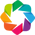

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [x,y]

In [6]:
import holoviews as hv
import geoviews as gv
from pyproj import Transformer
from shapely.ops import transform

hv.extension("bokeh")

basemap = gv.tile_sources.EsriImagery()

transformer = Transformer.from_crs(
    "EPSG:4326",
    "EPSG:3857",
    always_xy=True
)

aoi_3857 = transform(
    transformer.transform,
    aoi_geom
)

# Get transformed polygon coordinates
coords_3857 = list(aoi_3857.exterior.coords)


aoi = hv.Polygons(
    [coords_3857]
).opts(
    fill_alpha=0.15,
    line_color="red",
    line_width=3,
)

xmin, ymin, xmax, ymax = aoi_3857.bounds

# Add a little padding
pad_x = (xmax - xmin) * 0.05
pad_y = (ymax - ymin) * 0.05

m = (basemap * aoi).opts(
    width=800,
    height=600,
    xlim=(xmin - pad_x, xmax + pad_x),
    ylim=(ymin - pad_y, ymax + pad_y),
)

m

## 2.1 Core pipeline — ingestion

### Search CDSE STAC for Sentinel-2 L2A scenes

We search the full pre+post window in one call, then split the results by date relative to the fire record. We filter server-side on `eo:cloud_cover` as a first coarse pass (cheap), and will apply the proper per-pixel SCL mask after loading — cloud-cover metadata alone is not reliable enough to decide which pixels are usable near a wildfire, since smoke often isn't well captured by the standard cloud statistic.


In [54]:
STAC_URL = "https://stac.dataspace.copernicus.eu/v1"
catalog = pystac_client.Client.open(STAC_URL)

search = catalog.search(
    collections=["sentinel-2-l2a"],
    bbox=AOI_BBOX,
    datetime=FULL_DATETIME_RANGE,
    query={"eo:cloud_cover": {"lt": 20}},  # coarse pre-filter; SCL masking does the real work later
)

items = list(search.item_collection())
print(f"Found {len(items)} candidate Sentinel-2 L2A items")

items_meta = pd.DataFrame([
    {
        "id": it.id,
        "datetime": pd.Timestamp(it.datetime),
        "cloud_cover": it.properties.get("eo:cloud_cover"),
    }
    for it in items
]).sort_values("datetime").reset_index(drop=True)

items_meta["period"] = np.where(items_meta["datetime"] < FIRE_IGNITION, "pre-fire", "post-fire")
items_meta


Found 25 candidate Sentinel-2 L2A items


,id,datetime,cloud_cover,period
0,S2B_MSIL2A_20250610T095029_N0511_R079_T33TVF_2...,2025-06-10 09:50:29.025000+00:00,2.473024,pre-fire
1,S2C_MSIL2A_20250615T095051_N0511_R079_T33TVF_2...,2025-06-15 09:50:51.025000+00:00,0.584597,pre-fire
2,S2A_MSIL2A_20250617T095051_N0511_R079_T33TVF_2...,2025-06-17 09:50:51.024000+00:00,12.618899,pre-fire
3,S2B_MSIL2A_20250620T095029_N0511_R079_T33TVF_2...,2025-06-20 09:50:29.024000+00:00,1.505549,pre-fire
4,S2C_MSIL2A_20250625T095051_N0511_R079_T33TVF_2...,2025-06-25 09:50:51.025000+00:00,0.961370,pre-fire
5,S2A_MSIL2A_20250627T095041_N0511_R079_T33TVF_2...,2025-06-27 09:50:41.024000+00:00,0.266356,pre-fire
6,S2B_MSIL2A_20250630T095029_N0511_R079_T33TVF_2...,2025-06-30 09:50:29.024000+00:00,1.190165,pre-fire
7,S2C_MSIL2A_20250705T095051_N0511_R079_T33TVF_2...,2025-07-05 09:50:51.025000+00:00,1.651202,pre-fire
8,S2C_MSIL2A_20250715T095051_N0511_R079_T33TVF_2...,2025-07-15 09:50:51.025000+00:00,10.688996,pre-fire
9,S2A_MSIL2A_20250717T095051_N0511_R079_T33TVF_2...,2025-07-17 09:50:51.024000+00:00,12.392072,pre-fire


### Select the working set of acquisitions

The assignment requires **at least 6 real acquisitions**. We keep every item under a moderate cloud-cover threshold from both periods for the time series, and separately flag the single cleanest pre-fire and cleanest post-fire date to build the dNBR severity product from (see §1 above on why we avoid the first post-fire date).


In [55]:
CLOUD_THRESHOLD = 10  # % — generous first pass; SCL masking refines per-pixel below

usable = items_meta[items_meta["cloud_cover"] <= CLOUD_THRESHOLD].copy()
print(f"{len(usable)} / {len(items_meta)} items at or under {CLOUD_THRESHOLD}% scene cloud cover")
assert len(usable) >= 6, "Fewer than 6 usable acquisitions — relax CLOUD_THRESHOLD or widen the date windows."

best_pre_id  = usable[usable["period"] == "pre-fire"].sort_values("cloud_cover").iloc[0]["id"]
best_post_id = usable[usable["period"] == "post-fire"].sort_values("cloud_cover").iloc[0]["id"]
print("Reference pre-fire scene: ", best_pre_id)
print("Reference post-fire scene:", best_post_id)

selected_items = [it for it in items if it.id in set(usable["id"])]


17 / 25 items at or under 10% scene cloud cover
Reference pre-fire scene:  S2A_MSIL2A_20250806T095041_N0511_R079_T33TVF_20250806T122913
Reference post-fire scene: S2B_MSIL2A_20250809T095029_N0511_R079_T33TVF_20250809T105041


In [56]:
print(list(selected_items[0].assets.keys()))

['AOT_10m', 'AOT_20m', 'AOT_60m', 'B01_20m', 'B01_60m', 'B02_10m', 'B02_20m', 'B02_60m', 'B03_10m', 'B03_20m', 'B03_60m', 'B04_10m', 'B04_20m', 'B04_60m', 'B05_20m', 'B05_60m', 'B06_20m', 'B06_60m', 'B07_20m', 'B07_60m', 'B08_10m', 'B09_60m', 'B11_20m', 'B11_60m', 'B12_20m', 'B12_60m', 'B8A_20m', 'B8A_60m', 'Product', 'SCL_20m', 'SCL_60m', 'TCI_10m', 'TCI_20m', 'TCI_60m', 'WVP_10m', 'WVP_20m', 'WVP_60m', 'thumbnail', 'safe_manifest', 'granule_metadata', 'inspire_metadata', 'product_metadata', 'datastrip_metadata']


### Load into an analysis-ready datacube

`odc.stac.load` reprojects and stacks all selected items into a single `xarray.Dataset` indexed by `(time, y, x)`, at a common 10 m grid in the scene's native UTM zone. We load the bands needed for NBR, BAI, NDVI and the SCL mask: Blue (B02), Red (B04), NIR (B08), SWIR2 (B12), and SCL.


In [77]:
BANDS = ["B02_10m","B03_10m", "B04_10m", "B08_10m", "B12_20m","B11_20m", "SCL_20m"]

ds = odc.stac.load(
    selected_items,
    bands=BANDS,
    bbox=AOI_BBOX,
    crs="EPSG:32633",
    resolution=10,
    chunks={"x": 1024, "y": 1024},
    groupby="solar_day",
)

ds = ds.rename({
    "B02_10m": "blue",
    "B03_10m": "green",
    "B04_10m": "red",
    "B08_10m": "nir",
    "B12_20m": "swir22",
    "B11_20m": "swir16",
    "SCL_20m": "scl",
})

In [78]:
# Checking one band projection
href = selected_items[0].assets["B04_10m"].href
print(href)

with rasterio.open(href) as src:
    print("CRS:", src.crs)
    print("bounds:", src.bounds)
    print("shape:", src.width, src.height)

s3://eodata/Sentinel-2/MSI/L2A/2025/09/18/S2B_MSIL2A_20250918T095029_N0511_R079_T33TVF_20250918T123107.SAFE/GRANULE/L2A_T33TVF_A044578_20250918T095025/IMG_DATA/R10m/T33TVF_20250918T095029_B04_10m.jp2
CRS: EPSG:32633
bounds: BoundingBox(left=399960.0, bottom=4490220.0, right=509760.0, top=4600020.0)
shape: 10980 10980


In [79]:
os.environ.pop("PROJ_DATA", None)

import rasterio
with rasterio.open(href) as src:
    print("CRS:", src.crs)

CRS: EPSG:32633


## 2.2 Preprocessing

1. **Scale reflectance.** L2A surface reflectance bands are stored as `DN / 10000`; convert to physical   reflectance (0–1) before computing any index.
2. **Cloud / cloud-shadow / snow masking via SCL.** The Scene Classification Layer flags, per pixel, classes such   as cloud, cloud shadow, cirrus and saturated/defective pixels. We mask out anything that isn't   vegetation / not-vegetated / water / unclassified / snow(rare here) — i.e. we keep the classes we can trust for   index computation and drop the rest.
3. **Temporal handling.** After masking, some dates will have partial AOI coverage (masked cloud fragments). We   keep per-date arrays with NaNs where masked rather than dropping whole dates, so the time-series plot in §2.3   reflects real data availability per pixel/zone rather than silently interpolating.


In [82]:
# SCL class reference (Sentinel-2 L2A):
# 0 no data, 1 saturated/defective, 2 dark area, 3 cloud shadow, 4 vegetation, 5 not-vegetated,
# 6 water, 7 unclassified, 8 cloud medium prob., 9 cloud high prob., 10 thin cirrus, 11 snow/ice
SCL_KEEP = [2, 4, 5, 6, 7, 11]  # drop saturated/defective, cloud shadow, and all cloud/cirrus classes

scl = ds["scl"]
valid_mask = scl.isin(SCL_KEEP)

# Scale optical bands to physical reflectance and apply the mask
refl_bands = ["blue","green", "red", "nir", "swir22","swir16"]
ds_refl = (ds[refl_bands] / 10000.0).where(valid_mask)

# Per-date valid-pixel fraction over the AOI — a quick, honest data-quality check to report in the notebook
valid_frac = valid_mask.mean(dim=["x", "y"]).compute()
valid_frac_df = valid_frac.to_series().rename("valid_pixel_fraction").to_frame()
valid_frac_df.index.name = "time"
valid_frac_df


,valid_pixel_fraction
time,
2025-06-10 09:50:29.025,0.981104
2025-06-15 09:50:51.025,0.998779
2025-06-20 09:50:29.024,0.738119
2025-06-25 09:50:51.025,0.987771
2025-06-27 09:50:41.024,1.000000
2025-06-30 09:50:29.024,1.000000
2025-07-05 09:50:51.025,0.979635
2025-07-20 09:50:29.024,0.331042
2025-07-27 09:51:01.024,0.783161


Drop any date where masking leaves too little usable AOI coverage to be meaningful (e.g. < 60% valid), then confirm we still satisfy the ≥6-acquisition requirement *after* masking, not just at search time.


In [83]:
MIN_VALID_FRACTION = 0.90

keep_times = valid_frac_df[valid_frac_df["valid_pixel_fraction"] >= MIN_VALID_FRACTION].index
ds_refl = ds_refl.sel(time=keep_times)

print(f"{ds_refl.sizes['time']} acquisitions retained after SCL masking "
      f"(>= {MIN_VALID_FRACTION:.0%} valid AOI coverage)")
assert ds_refl.sizes["time"] >= 6, "Fewer than 6 acquisitions survive masking — revisit thresholds/date windows."

ds_refl


10 acquisitions retained after SCL masking (>= 90% valid AOI coverage)


<xarray.Dataset> Size: 198MB
Dimensions:      (time: 10, y: 648, x: 637)
Coordinates:
  * time         (time) datetime64[us] 80B 2025-06-10T09:50:29.025000 ... 202...
  * y            (y) float64 5kB 4.522e+06 4.522e+06 ... 4.516e+06 4.516e+06
  * x            (x) float64 5kB 4.523e+05 4.523e+05 ... 4.587e+05 4.587e+05
    spatial_ref  int32 4B 32633
Data variables:
    blue         (time, y, x) float64 33MB dask.array<chunksize=(1, 648, 637), meta=np.ndarray>
    green        (time, y, x) float64 33MB dask.array<chunksize=(1, 648, 637), meta=np.ndarray>
    red          (time, y, x) float64 33MB dask.array<chunksize=(1, 648, 637), meta=np.ndarray>
    nir          (time, y, x) float64 33MB dask.array<chunksize=(1, 648, 637), meta=np.ndarray>
    swir22       (time, y, x) float64 33MB dask.array<chunksize=(1, 648, 637), meta=np.ndarray>
    swir16       (time, y, x) float64 33MB dask.array<chunksize=(1, 648, 637), meta=np.ndarray>

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
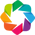

BokehModel(combine_events=True, render_bundle={'docs_json': {'39e8b725-eab9-47ad-8e33-db6926339414': {'version…

In [174]:
import holoviews as hv
import panel as pn
import numpy as np

hv.extension("bokeh")
pn.extension()


# --------------------------------------------------
# Image function
# --------------------------------------------------

def make_rgb(i):

    img = ds_refl.isel(time=i)

    # SWIR2 / NIR / Red
    r = img["swir22"].compute().values
    g = img["nir"].compute().values
    b = img["red"].compute().values

    rgb = np.stack([r, g, b], axis=-1)

    # 2–98 percentile stretch
    for j in range(3):

        valid = np.isfinite(rgb[..., j])

        if valid.any():

            lo, hi = np.nanpercentile(
                rgb[..., j][valid],
                [2, 98]
            )

            if hi > lo:
                rgb[..., j] = (
                    rgb[..., j] - lo
                ) / (hi - lo)

    rgb = np.clip(rgb, 0, 1)

    date = np.datetime_as_string(
        ds_refl.time.values[i],
        unit="D"
    )

    return hv.RGB(
        (
            ds_refl.x.values,
            ds_refl.y.values,
            rgb
        ),
        kdims=["x", "y"]
    ).opts(
        width=800,
        height=600,
        xlabel="Easting (m)",
        ylabel="Northing (m)",
        title=f"SWIR2 / NIR / Red — {date}"
    )


# --------------------------------------------------
# Integer slider
# --------------------------------------------------

slider = pn.widgets.IntSlider(
    name="Acquisition",
    start=0,
    end=ds_refl.sizes["time"] - 1,
    value=0,
    step=1
)


# --------------------------------------------------
# Date displayed below slider
# --------------------------------------------------

@pn.depends(slider.param.value)
def date_label(i):

    date = np.datetime_as_string(
        ds_refl.time.values[i],
        unit="D"
    )

    return pn.pane.Markdown(
        f"### Acquisition: `{date}`",
        width=300
    )


# --------------------------------------------------
# Update image
# --------------------------------------------------

@pn.depends(slider.param.value)
def view(i):
    return make_rgb(i)


# --------------------------------------------------
# Final layout
# --------------------------------------------------

pn.Column(
    view,
    slider,
    date_label,
    width=400
)

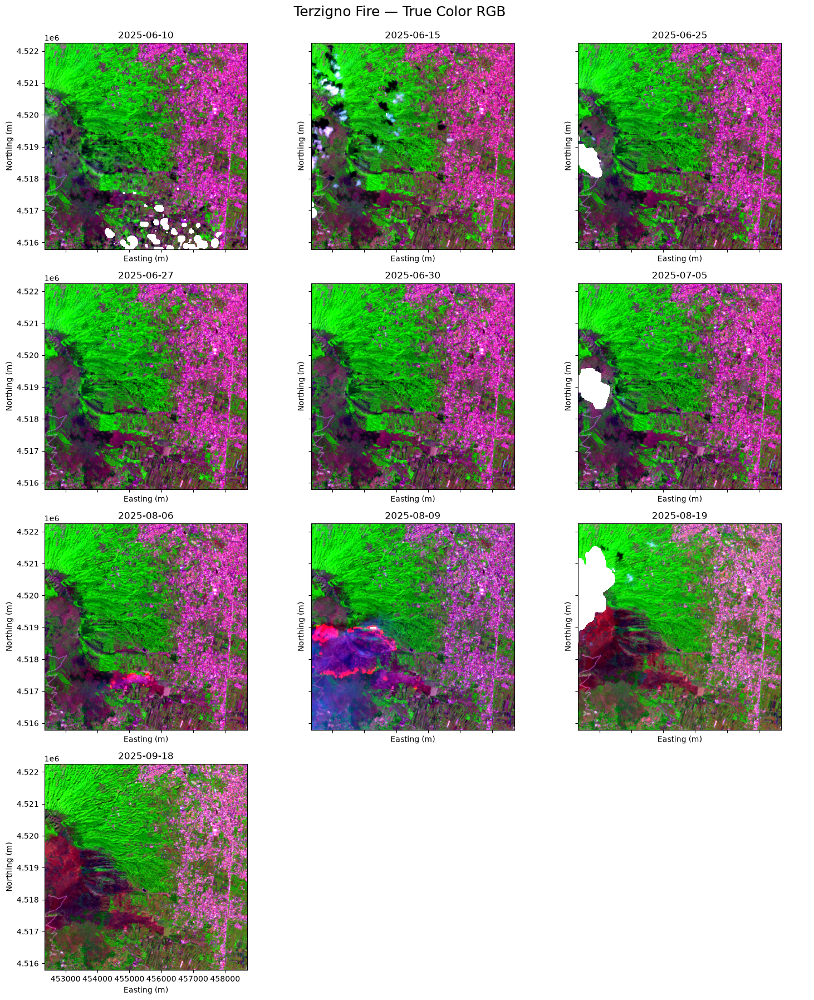

In [63]:
import matplotlib.pyplot as plt
import numpy as np
import math

n_images = ds_refl.sizes["time"]
ncols = 3
nrows = math.ceil(n_images / ncols)

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(15, 4.5 * nrows),
    sharex=True,
    sharey=True
)

axes = np.atleast_1d(axes).ravel()

# --------------------------------------------------
# Plot each acquisition
# --------------------------------------------------
for i in range(n_images):

    ax = axes[i]

    img = ds_refl.isel(time=i)

    # True RGB: Red / Green / Blue
    r = img["swir22"].compute().values
    g = img["nir"].compute().values
    b = img["red"].compute().values

    rgb = np.stack([r, g, b], axis=-1)

    # --------------------------------------------------
    # Robust 2–98 percentile stretch
    # --------------------------------------------------
    for band in range(3):

        valid = np.isfinite(rgb[..., band])

        if valid.any():

            lo, hi = np.nanpercentile(
                rgb[..., band][valid],
                [2, 98]
            )

            if hi > lo:
                rgb[..., band] = (
                    rgb[..., band] - lo
                ) / (hi - lo)

    rgb = np.clip(rgb, 0, 1)

    # --------------------------------------------------
    # Plot
    # --------------------------------------------------
    ax.imshow(
        rgb,
        extent=[
            float(ds_refl.x.min()),
            float(ds_refl.x.max()),
            float(ds_refl.y.min()),
            float(ds_refl.y.max())
        ],
        origin="upper",
        aspect="equal"
    )

    date = np.datetime_as_string(
        ds_refl.time.values[i],
        unit="D"
    )

    ax.set_title(date, fontsize=12)

    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")


# --------------------------------------------------
# Hide unused panels
# --------------------------------------------------
for i in range(n_images, len(axes)):
    axes[i].axis("off")


plt.suptitle(
    "Terzigno Fire — True Color RGB",
    fontsize=18,
    y=0.995
)

plt.tight_layout()
plt.show()

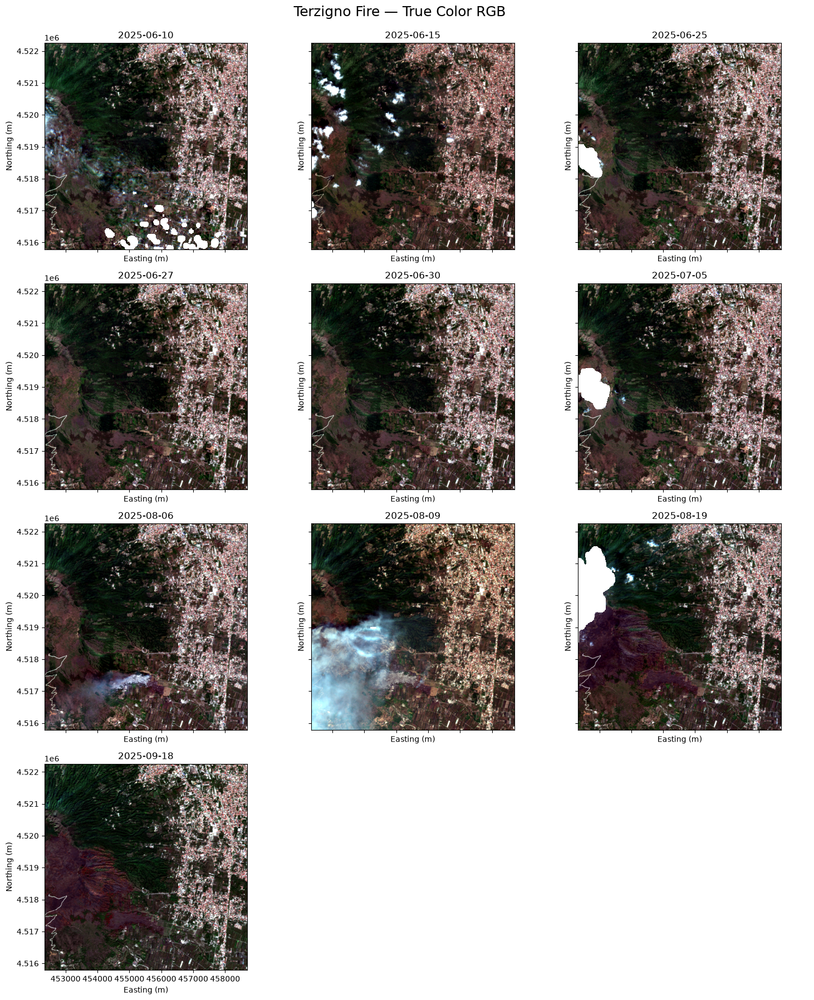

In [64]:
import matplotlib.pyplot as plt
import numpy as np
import math

n_images = ds_refl.sizes["time"]
ncols = 3
nrows = math.ceil(n_images / ncols)

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(15, 4.5 * nrows),
    sharex=True,
    sharey=True
)

axes = np.atleast_1d(axes).ravel()

# --------------------------------------------------
# Plot each acquisition
# --------------------------------------------------
for i in range(n_images):

    ax = axes[i]

    img = ds_refl.isel(time=i)

    # True RGB: Red / Green / Blue
    r = img["red"].compute().values
    g = img["green"].compute().values
    b = img["blue"].compute().values

    rgb = np.stack([r, g, b], axis=-1)

    # --------------------------------------------------
    # Robust 2–98 percentile stretch
    # --------------------------------------------------
    for band in range(3):

        valid = np.isfinite(rgb[..., band])

        if valid.any():

            lo, hi = np.nanpercentile(
                rgb[..., band][valid],
                [2, 98]
            )

            if hi > lo:
                rgb[..., band] = (
                    rgb[..., band] - lo
                ) / (hi - lo)

    rgb = np.clip(rgb, 0, 1)

    # --------------------------------------------------
    # Plot
    # --------------------------------------------------
    ax.imshow(
        rgb,
        extent=[
            float(ds_refl.x.min()),
            float(ds_refl.x.max()),
            float(ds_refl.y.min()),
            float(ds_refl.y.max())
        ],
        origin="upper",
        aspect="equal"
    )

    date = np.datetime_as_string(
        ds_refl.time.values[i],
        unit="D"
    )

    ax.set_title(date, fontsize=12)

    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")


# --------------------------------------------------
# Hide unused panels
# --------------------------------------------------
for i in range(n_images, len(axes)):
    axes[i].axis("off")


plt.suptitle(
    "Terzigno Fire — True Color RGB",
    fontsize=18,
    y=0.995
)

plt.tight_layout()
plt.show()

In [84]:
import numpy as np
import xarray as xr

# --------------------------------------------------
# Split acquisitions into pre- and post-fire
# --------------------------------------------------

pre = ds_refl.sel(
    time=slice(PRE_START, PRE_END)
)

post = ds_refl.sel(
    time=slice(POST_START, POST_END)
)

print("Pre-fire acquisitions:")
print(pre.time.values)

print("\nPost-fire acquisitions:")
print(post.time.values)

print("\nCounts:")
print("Pre :", pre.sizes["time"])
print("Post:", post.sizes["time"])

Pre-fire acquisitions:
['2025-06-10T09:50:29.025000' '2025-06-15T09:50:51.025000'
 '2025-06-25T09:50:51.025000' '2025-06-27T09:50:41.024000'
 '2025-06-30T09:50:29.024000' '2025-07-05T09:50:51.025000'
 '2025-08-06T09:50:41.024000']

Post-fire acquisitions:
['2025-08-19T09:50:29.024000' '2025-09-18T09:50:29.025000']

Counts:
Pre : 7
Post: 2


In [85]:
# --------------------------------------------------
# Temporal median composites
# --------------------------------------------------

pre_median = pre.median(
    dim="time",
    skipna=True
)

post_median = post.median(
    dim="time",
    skipna=True
)

print("Pre-fire median:")
print(pre_median)

print("\nPost-fire median:")
print(post_median)

Pre-fire median:
<xarray.Dataset> Size: 20MB
Dimensions:      (y: 648, x: 637)
Coordinates:
  * y            (y) float64 5kB 4.522e+06 4.522e+06 ... 4.516e+06 4.516e+06
  * x            (x) float64 5kB 4.523e+05 4.523e+05 ... 4.587e+05 4.587e+05
    spatial_ref  int32 4B 32633
Data variables:
    blue         (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    green        (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    red          (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    nir          (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    swir22       (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    swir16       (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>

Post-fire median:
<xarray.Dataset> Size: 20MB
Dimensions:      (y: 648, x: 637)
Coordinates:
  * y            (y) float64 5kB 4.522e+06 4.522e+06 ... 4.516e+06 4.516e+06
  * x            (x

In [86]:
def calculate_ndvi(ds):
    return (
        (ds["nir"] - ds["red"]) /
        (ds["nir"] + ds["red"])
    ).where(
        (ds["nir"] + ds["red"]) != 0
    )

ndvi_pre = calculate_ndvi(pre_median)
ndvi_post = calculate_ndvi(post_median)

dndvi = ndvi_pre - ndvi_post   # <-- was ndvi_post - ndvi_pre

ndvi_pre.name = "NDVI_pre"
ndvi_post.name = "NDVI_post"
dndvi.name = "dNDVI"

In [87]:
def calculate_nbr(ds):

    return (
        (ds["nir"] - ds["swir22"]) /
        (ds["nir"] + ds["swir22"])
    ).where(
        (ds["nir"] + ds["swir22"]) != 0
    )


nbr_pre = calculate_nbr(pre_median)
nbr_post = calculate_nbr(post_median)

dnbr = nbr_pre - nbr_post

nbr_pre.name = "NBR_pre"
nbr_post.name = "NBR_post"
dnbr.name = "dNBR"

In [88]:
def calculate_bai(ds):

    return 1.0 / (
        (0.1 - ds["red"]) ** 2 +
        (0.06 - ds["nir"]) ** 2
    )


bai_pre = calculate_bai(pre_median)
bai_post = calculate_bai(post_median)

dbai = bai_post - bai_pre

bai_pre.name = "BAI_pre"
bai_post.name = "BAI_post"
dbai.name = "dBAI"

In [89]:
def calculate_ndmi(ds):
    return (
        (ds["nir"] - ds["swir16"]) /
        (ds["nir"] + ds["swir16"])
    ).where(
        (ds["nir"] + ds["swir16"]) != 0
    )

ndmi_pre = calculate_ndmi(pre_median)
ndmi_post = calculate_ndmi(post_median)

dndmi = ndmi_pre - ndmi_post   # positive = drying/loss, consistent convention

ndmi_pre.name = "NDMI_pre"
ndmi_post.name = "NDMI_post"
dndmi.name = "dNDMI"

In [71]:
results = xr.Dataset({
    "NDVI_pre": ndvi_pre,
    "NDVI_post": ndvi_post,
    "dNDVI": dndvi,

    "NBR_pre": nbr_pre,
    "NBR_post": nbr_post,
    "dNBR": dnbr,

    "BAI_pre": bai_pre,
    "BAI_post": bai_post,
    "dBAI": dbai,

    "NDMI_pre": ndmi_pre,
    "NDMI_post": ndmi_post,
    "dNDMI": dndmi,
})

print(results)

<xarray.Dataset> Size: 40MB
Dimensions:      (y: 648, x: 637)
Coordinates:
  * y            (y) float64 5kB 4.522e+06 4.522e+06 ... 4.516e+06 4.516e+06
  * x            (x) float64 5kB 4.523e+05 4.523e+05 ... 4.587e+05 4.587e+05
    spatial_ref  int32 4B 32633
Data variables:
    NDVI_pre     (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    NDVI_post    (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    dNDVI        (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    NBR_pre      (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    NBR_post     (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    dNBR         (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    BAI_pre      (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    BAI_post     (y, x) float64 3MB dask.array<chunksize=(648, 637), meta=np.ndarray>
    dBAI         (y, x) float64 3MB

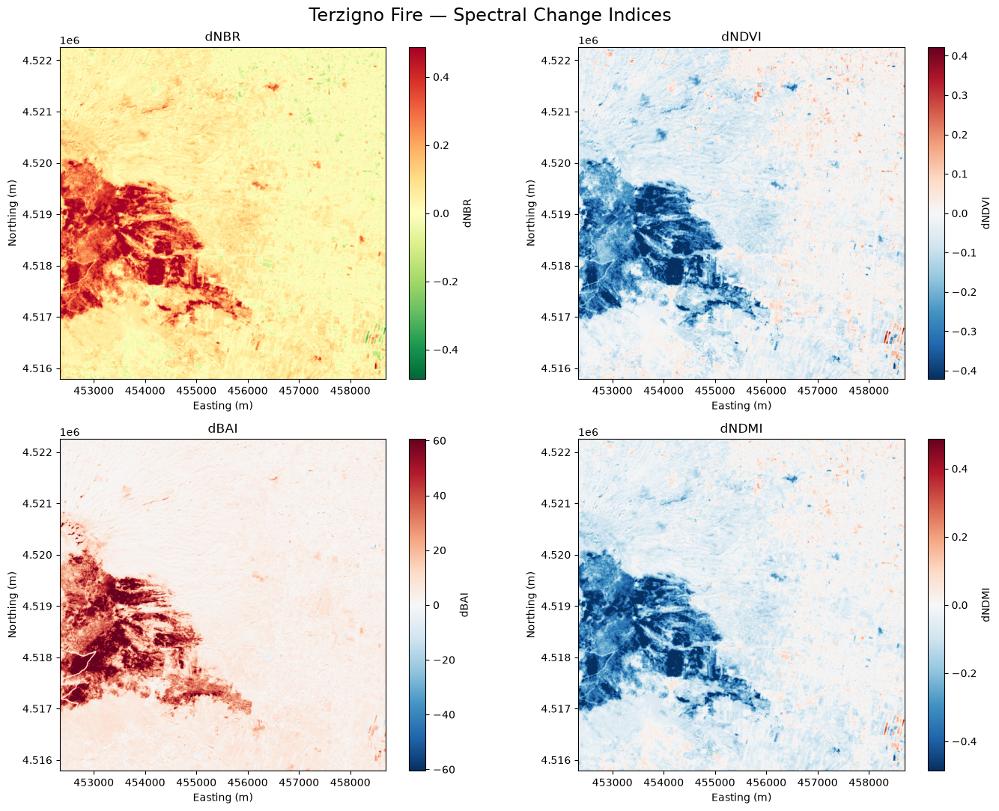

In [90]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(
    2, 2,
    figsize=(14, 11)
)

maps = [
    ("dNBR", "RdYlGn_r", "dNBR"),
    ("dNDVI", "RdBu_r", "dNDVI"),
    ("dBAI", "RdBu_r", "dBAI"),
    ("dNDMI", "RdBu_r", "dNDMI"),
]

for ax, (var, cmap, title) in zip(axes.ravel(), maps):

    data = results[var].values

    # Robust symmetric range
    limit = np.nanpercentile(
        np.abs(data),
        98
    )

    im = ax.imshow(
        data,
        extent=[
            float(ds_refl.x.min()),
            float(ds_refl.x.max()),
            float(ds_refl.y.min()),
            float(ds_refl.y.max())
        ],
        origin="upper",
        cmap=cmap,
        vmin=-limit,
        vmax=limit
    )

    ax.set_title(title)
    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")

    plt.colorbar(
        im,
        ax=ax,
        label=title
    )

plt.suptitle(
    "Terzigno Fire — Spectral Change Indices",
    fontsize=17
)

plt.tight_layout()
plt.show()

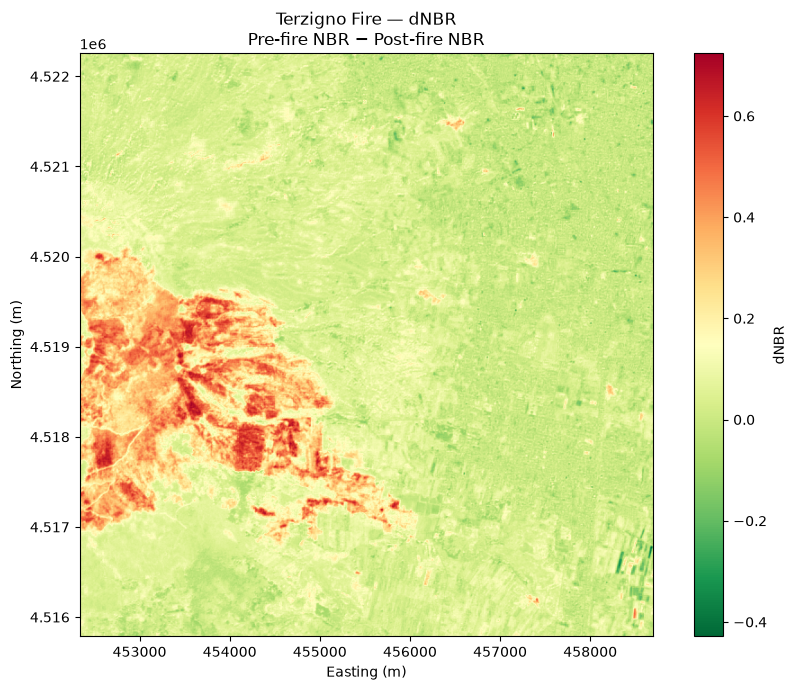

In [91]:
fig, ax = plt.subplots(
    figsize=(9, 7)
)

data = results["dNBR"].values

im = ax.imshow(
    data,
    extent=[
        float(ds_refl.x.min()),
        float(ds_refl.x.max()),
        float(ds_refl.y.min()),
        float(ds_refl.y.max())
    ],
    origin="upper",
    cmap="RdYlGn_r"
)

ax.set_title(
    "Terzigno Fire — dNBR\n"
    "Pre-fire NBR − Post-fire NBR"
)

ax.set_xlabel("Easting (m)")
ax.set_ylabel("Northing (m)")

plt.colorbar(
    im,
    ax=ax,
    label="dNBR"
)

plt.tight_layout()
plt.show()

Burnt area

In [93]:
dbai = results["dBAI"]

# Example threshold: upper 95th percentile of dBAI
threshold = float(
    np.nanpercentile(dbai.values, 95)
)

burned_mask = (
    dbai.values >= threshold
) & np.isfinite(dbai.values)

print("dBAI threshold:", threshold)
print("Burned pixels:", burned_mask.sum())

dBAI threshold: 42.81553908718547
Burned pixels: 20639


In [164]:
from shapely.ops import unary_union
from shapely import concave_hull

# ---------------------------------------------------------
# Remove small isolated burned patches
# ---------------------------------------------------------

MIN_PATCH_AREA_M2 = 1000

burned_polygons_filtered = [
    poly
    for poly in burned_polygons
    if poly.area >= MIN_PATCH_AREA_M2
]

print(
    f"Original burned polygons: {len(burned_polygons)}"
)

print(
    f"After filtering (< {MIN_PATCH_AREA_M2} m²): "
    f"{len(burned_polygons_filtered)}"
)


# ---------------------------------------------------------
# Merge remaining burned polygons
# ---------------------------------------------------------

burned_union = unary_union(
    burned_polygons_filtered
)

print(
    "Filtered burned geometry:",
    burned_union.geom_type
)


# ---------------------------------------------------------
# Concave hull
# ---------------------------------------------------------

burned_hull = concave_hull(
    burned_union,
    ratio=0.15
)

print(
    f"Concave hull area: "
    f"{burned_hull.area / 10_000:.2f} ha"
)

Original burned polygons: 556
After filtering (< 1000 m²): 95
Filtered burned geometry: MultiPolygon
Concave hull area: 526.41 ha


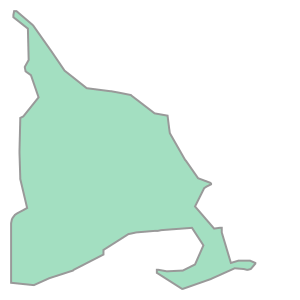

In [165]:
burned_hull

In [166]:

hull_gdf = gpd.GeoDataFrame(
    {
        "name": ["Terzigno_burned_area"],
        "index": ["dBAI"],
        "threshold": [threshold],
        "area_ha": [burned_hull.area / 10_000],
    },
    geometry=[burned_hull],
    crs=ds_refl.rio.crs
)

hull_gdf_wgs84 = hull_gdf.to_crs("EPSG:4326")

hull_gdf_wgs84.to_file(
    "terzigno_burned_area_convex_hull.geojson",
    driver="GeoJSON"
)

print("Saved: terzigno_burned_area_convex_hull.geojson")

Saved: terzigno_burned_area_convex_hull.geojson


In [167]:
hull_gdf

,name,index,threshold,area_ha,geometry
0,Terzigno_burned_area,dBAI,42.815539,526.415,"POLYGON ((452360 4520570, 452370 4520620, 4524..."


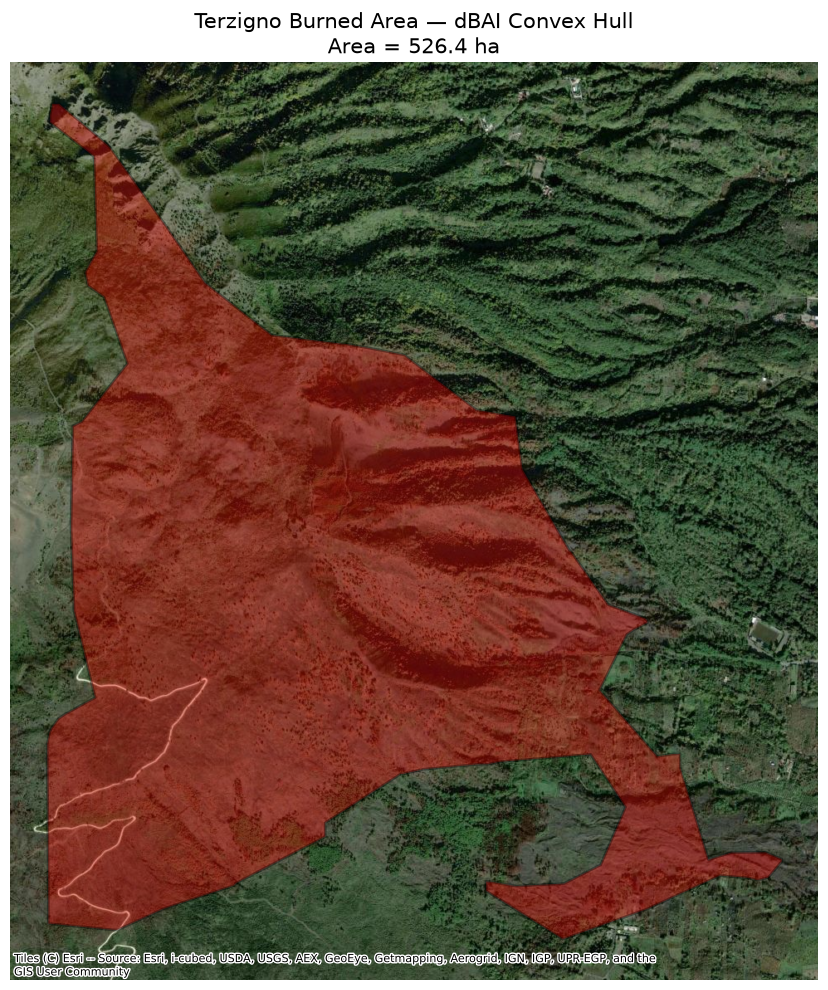

In [168]:

hull_web = hull_gdf.to_crs("EPSG:3857")

fig, ax = plt.subplots(figsize=(10, 10))

hull_web.plot(
    ax=ax,
    facecolor="red",
    edgecolor="black",
    alpha=0.35,
    linewidth=2
)

ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldImagery
)

ax.set_title(
    f"Terzigno Burned Area — dBAI Convex Hull\n"
    f"Area = {burned_hull.area / 10_000:.1f} ha",
    fontsize=15
)

ax.set_axis_off()

plt.tight_layout()
plt.show()

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
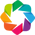

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [x,y]

In [169]:

hv.extension("bokeh")

transformer = Transformer.from_crs(
    "EPSG:32633",
    "EPSG:3857",
    always_xy=True
)

hull_3857 = transform(
    transformer.transform,
    burned_hull
)

hull_hv = hv.Polygons(
    [list(hull_3857.exterior.coords)]
).opts(
    fill_alpha=0.30,
    fill_color="red",
    line_color="red",
    line_width=3,
)

basemap = gv.tile_sources.EsriImagery()

xmin, ymin, xmax, ymax = hull_3857.bounds

pad_x = (xmax - xmin) * 0.10
pad_y = (ymax - ymin) * 0.10

(
    basemap * hull_hv
).opts(
    width=900,
    height=700,
    xlim=(xmin - pad_x, xmax + pad_x),
    ylim=(ymin - pad_y, ymax + pad_y),
)

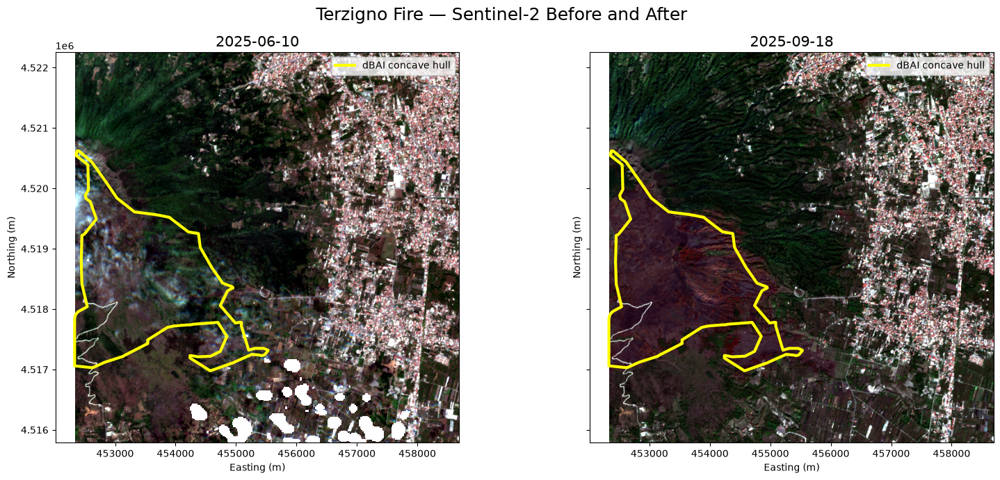

In [173]:
import matplotlib.pyplot as plt
import numpy as np

# --------------------------------------------------
# First and last Sentinel-2 acquisitions
# --------------------------------------------------

indices = [0, -1]

fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 7),
    sharex=True,
    sharey=True
)

for ax, i in zip(axes, indices):

    img = ds_refl.isel(time=i)

    # --------------------------------------------------
    # True RGB
    # --------------------------------------------------

    r = img["red"].compute().values
    g = img["green"].compute().values
    b = img["blue"].compute().values

    rgb = np.stack([r, g, b], axis=-1)

    # --------------------------------------------------
    # Robust 2–98 percentile stretch
    # --------------------------------------------------

    for band in range(3):

        valid = np.isfinite(rgb[..., band])

        if valid.any():

            lo, hi = np.nanpercentile(
                rgb[..., band][valid],
                [2, 98]
            )

            if hi > lo:
                rgb[..., band] = (
                    rgb[..., band] - lo
                ) / (hi - lo)

    rgb = np.clip(rgb, 0, 1)

    # --------------------------------------------------
    # Plot RGB
    # --------------------------------------------------

    ax.imshow(
        rgb,
        extent=[
            float(ds_refl.x.min()),
            float(ds_refl.x.max()),
            float(ds_refl.y.min()),
            float(ds_refl.y.max())
        ],
        origin="upper",
        aspect="equal"
    )

    # --------------------------------------------------
    # Concave hull on both images
    # --------------------------------------------------

    x_hull, y_hull = burned_hull.exterior.xy

    ax.plot(
        x_hull,
        y_hull,
        color="yellow",
        linewidth=3,
        label="dBAI concave hull"
    )

    # --------------------------------------------------
    # Date
    # --------------------------------------------------

    date = np.datetime_as_string(
        ds_refl.time.values[i],
        unit="D"
    )

    ax.set_title(
        date,
        fontsize=15
    )

    ax.set_xlabel("Easting (m)")
    ax.set_ylabel("Northing (m)")

    ax.legend(
        loc="upper right"
    )


plt.suptitle(
    "Terzigno Fire — Sentinel-2 Before and After",
    fontsize=18,
    y=0.98
)

plt.tight_layout()
plt.show()